<a href="https://colab.research.google.com/github/BelKaty/BelKaProject/blob/main/HW7_NN_AI.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Вебинар 7. Детектирование объектов  

* Домашнее задание:  
1. Сделайте краткий обзор любой научной работы, посвящённой алгоритму для object detection, не рассматривавшемуся
на уроке. Проведите анализ: чем отличается выбранная вами архитектура нейронной сети от других? В чём плюсы и минусы
данной архитектуры? Какие могут возникнуть трудности при применении этой архитектуры на практике?
2. Поиграться с кодом урока в разделе Advanced, поменять код и написать свои выводы.

Либо 1 пункт либо пункт 2.

### Данный код был получен на сайте Keras
Ссылка - [Object Detection with KerasCV](https://keras.io/guides/keras_cv/object_detection_keras_cv/). На этой странице также ссылка на colab и GitHub проекта.

Другие полезные ссылки:
1. [Детекция объектов. R-CNN, Fast R-CNN, Faster R-CNN. Часть 1](https://habr.com/ru/articles/789942/)
2. [Распознавание образов с помощью искусственного интеллекта](https://habr.com/ru/articles/709432/)

### Установка пакетов
[Keras 3 Installation](https://keras.io/keras_cv/)

In [ ]:
# Чтобы в jupyter notebook не возникала ошибка при загрузке датасета, выполним команду в окружении ноутбука
# jupyter notebook --NotebookApp.iopub_data_rate_limit=1.0e10
# см. ссылку - https://stackoverflow.com/questions/43288550/iopub-data-rate-exceeded-in-jupyter-notebook-when-viewing-image

# #Обновим jupyter notebook
# !pip install -U jupyter

# #Установки Keras 3 с помощью KerasCV
# !pip install --upgrade keras-cv tensorflow
# !pip install --upgrade keras

# #Работа с рисунками, если его не установить, keras картинки загружать не будет
# !pip install Pillow

# #Отрисовка графиков, картинок
# !pip install matplotlib

# #Библиотека компьютерного зрения, которая предназначена для анализа, классификации и обработки изображений.
# !pip install opencv-python

# #Для работы с датасетом используется пакет pycocotools
# !pip install pycocotools

# Object Detection with KerasCV

**Author:** [lukewood](https://twitter.com/luke_wood_ml), Ian Stenbit, Tirth Patel<br>
**Date created:** 2023/04/08<br>
**Last modified:** 2023/08/10<br>
**Description:** Train an object detection model with KerasCV.

KerasCV offers a complete set of production grade APIs to solve object detection
problems.
These APIs include object-detection-specific
data augmentation techniques, Keras native COCO metrics, bounding box format
conversion utilities, visualization tools, pretrained object detection models,
and everything you need to train your own state of the art object detection
models!

Let's give KerasCV's object detection API a spin.

---
KerasCV предлагает полный набор API-интерфейсов производственного уровня для решения задач обнаружения объектов.
проблемы.
Эти API включают в себя функции, специфичные для обнаружения объектов.
методы увеличения данных, собственные метрики COCO Keras, формат ограничительной рамки
утилиты преобразования, инструменты визуализации, предварительно обученные модели обнаружения объектов,
и все, что вам нужно для обучения собственному современному обнаружению объектов
модели!

Давайте попробуем API обнаружения объектов KerasCV.

In [ ]:
from tensorflow import data as tf_data
import tensorflow_datasets as tfds
import keras
import keras_cv
import numpy as np
from keras_cv import bounding_box
import os
from keras_cv import visualization
import tqdm

import os

os.environ["KERAS_BACKEND"] = "jax"  # @param ["tensorflow", "jax", "torch"]


## Object detection introduction

Object detection is the process of identifying, classifying,
and localizing objects within a given image.  Typically, your inputs are
images, and your labels are bounding boxes with optional class
labels.
Object detection can be thought of as an extension of classification, however
instead of one class label for the image, you must detect and localize an
arbitrary number of classes.

**For example:**

<img width="300" src="https://i.imgur.com/8xSEbQD.png">

The data for the above image may look something like this:
```python
image = [height, width, 3]
bounding_boxes = {
  "classes": [0], # 0 is an arbitrary class ID representing "cat"
  "boxes": [[0.25, 0.4, .15, .1]]
   # bounding box is in "rel_xywh" format
   # so 0.25 represents the start of the bounding box 25% of
   # the way across the image.
   # The .15 represents that the width is 15% of the image width.
}
```

Since the inception of [*You Only Look Once*](https://arxiv.org/abs/1506.02640)
(aka YOLO),
object detection has primarily been solved using deep learning.
Most deep learning architectures do this by cleverly framing the object detection
problem as a combination of many small classification problems and
many regression problems.

More specifically, this is done by generating many anchor boxes of varying
shapes and sizes across the input images and assigning them each a class label,
as well as `x`, `y`, `width` and `height` offsets.
The model is trained to predict the class labels of each box, as well as the
`x`, `y`, `width`, and `height` offsets of each box that is predicted to be an
object.

**Visualization of some sample anchor boxes**:

<img width="400" src="https://i.imgur.com/cJIuiK9.jpg">

Objection detection is a technically complex problem but luckily we offer a
bulletproof approach to getting great results.
Let's do this!

---
## Введение в обнаружение объектов

Обнаружение объектов – это процесс идентификации, классификации,
и локализация объектов внутри данного изображения. Обычно ваши входные данные
изображения, а ваши метки представляют собой ограничивающие рамки с необязательным классом
этикетки.
Однако обнаружение объектов можно рассматривать как расширение классификации.
вместо одной метки класса для изображения необходимо обнаружить и локализовать
произвольное количество классов.

**Например:**

<img width="300" src="https://i.imgur.com/8xSEbQD.png">

Данные для изображения выше могут выглядеть примерно так:
```python
image = [height, width, 3]
bounding_boxes = {
  "classes": [0], # 0 — произвольный идентификатор класса, представляющий "кошку"
  "boxes": [[0.25, 0.4, .15, .1]]
   # ограничивающая рамка имеет формат "rel_xywh"
   # поэтому 0,25 представляет собой начало ограничивающей рамки на 25%
   # длины изображения.
   # .15 означает, что ширина составляет 15% ширины изображения.
}
```

С момента создания [*You Only Look Once*](https://arxiv.org/abs/1506.02640)
(aka YOLO),
Обнаружение объектов в основном решалось с помощью глубокого обучения.
Большинство архитектур глубокого обучения делают это, умело определяя обнаружение объектов.
проблема как комбинация многих небольших задач классификации и
множество проблем с регрессией.

Точнее, это делается путем создания множества якорных блоков разной
формы и размеры входных изображений и присвоение каждому из них метки класса,
а также смещения `x`, `y`, `width` и `height`.
Модель обучена прогнозировать метки классов каждого ящика, а также
Смещения `x`, `y`, `width` и `height` для каждого блока, который, по прогнозам, будет
объект.

**Визуализация некоторых примеров полей привязки**:

<img width="400" src="https://i.imgur.com/cJIuiK9.jpg">

Обнаружение возражений — технически сложная задача, но, к счастью, мы предлагаем
надежный подход к получению отличных результатов.
Давай сделаем это!

## Perform detections with a pretrained model

![](https://storage.googleapis.com/keras-nlp/getting_started_guide/prof_keras_beginner.png)

The highest level API in the KerasCV Object Detection API is the `keras_cv.models` API.
This API includes fully pretrained object detection models, such as
`keras_cv.models.YOLOV8Detector`.

Let's get started by constructing a YOLOV8Detector pretrained on the `pascalvoc`
dataset.

---
## Выполнение обнаружения с помощью предварительно обученной модели

![](https://storage.googleapis.com/keras-nlp/getting_started_guide/prof_keras_beginner.png)

API самого высокого уровня в API обнаружения объектов KerasCV — это `API keras_cv.models`.
Этот API включает в себя полностью предварительно обученные модели обнаружения объектов, такие как
`keras_cv.models.YOLOV8Detector`.

Давайте начнем с создания детектора YOLOV8, предварительно обученного на `pascalvoc`
набор данных.

In [ ]:
pretrained_model = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc", bounding_box_format="xywh"
)

Notice the `bounding_box_format` argument?

Recall in the section above, the format of bounding boxes:

```
bounding_boxes = {
  "classes": [num_boxes],
  "boxes": [num_boxes, 4]
}
```

This argument describes *exactly* what format the values in the `"boxes"`
field of the label dictionary take in your pipeline.
For example, a box in `xywh` format with its top left corner at the coordinates
(100, 100) with a width of 55 and a height of 70 would be represented by:
```
[100, 100, 55, 75]
```

or equivalently in `xyxy` format:

```
[100, 100, 155, 175]
```

While this may seem simple, it is a critical piece of the KerasCV object
detection API!
Every component that processes bounding boxes requires a
`bounding_box_format` argument.
You can read more about
KerasCV bounding box formats [in the API docs](https://keras.io/api/keras_cv/bounding_box/formats/).


This is done because there is no one correct format for bounding boxes!
Components in different pipelines expect different formats, and so by requiring
them to be specified we ensure that our components remain readable, reusable,
and clear.
Box format conversion bugs are perhaps the most common bug surface in object
detection pipelines - by requiring this parameter we mitigate against these
bugs (especially when combining code from many sources).

Next let's load an image:

---
Обратите внимание на аргумент `bounding_box_format`?

Напомним, в разделе выше описан формат ограничивающих рамок:

```
bounding_boxes = {
  "классы": [num_boxes],
  "коробки": [num_boxes, 4]
}
```

Этот аргумент *точно* описывает формат значений в `"boxes"`
поле словаря меток возьмите в свой конвейер.
Например, прямоугольник в формате xywh с левым верхним углом по координатам
(100, 100) шириной 55 и высотой 70 будут представлены следующим образом:
```
[100, 100, 55, 75]
```

или эквивалентно в формате xyxy:

```
[100, 100, 155, 175]
```

Хотя это может показаться простым, это важная часть объекта KerasCV.
API обнаружения!
Каждый компонент, обрабатывающий ограничивающие рамки, требует
Аргумент `bounding_box_format`.
Вы можете прочитать больше о
Форматы ограничивающей рамки KerasCV [in the API docs](https://keras.io/api/keras_cv/bounding_box/formats/).


Это сделано потому, что не существует единственного правильного формата ограничивающих рамок!
Компоненты в разных конвейерах ожидают разных форматов, поэтому, требуя
их необходимо указать, мы гарантируем, что наши компоненты остаются читабельными, пригодными для повторного использования,
и ясно.
Ошибки преобразования формата блока, пожалуй, наиболее распространенные ошибки в объектах.
конвейеры обнаружения — требуя этот параметр, мы уменьшаем эти проблемы.
ошибки (особенно при объединении кода из многих источников).

Далее загрузим изображение:

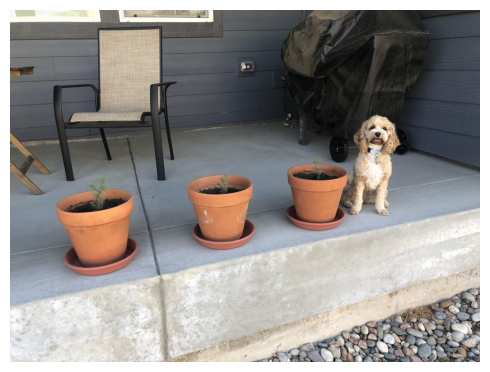

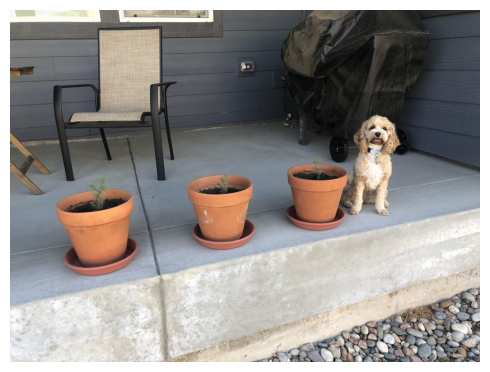

In [ ]:
filepath = keras.utils.get_file(origin='https://glonass-gps.net/test_img/gCNcJJI.jpg')
image = keras.utils.load_img(filepath)
image = np.array(image)

visualization.plot_image_gallery(
    np.array([image]),
    value_range=(0, 255),
    rows=1,
    cols=1,
    scale=5,
)

To use the `YOLOV8Detector` architecture with a ResNet50 backbone, you'll need to
resize your image to a size that is divisible by 64.  This is to ensure
compatibility with the number of downscaling operations done by the convolution
layers in the ResNet.

If the resize operation distorts
the input's aspect ratio, the model will perform signficantly poorer.  For the
pretrained `"yolo_v8_m_pascalvoc"` preset we are using, the final
`MeanAveragePrecision` on the `pascalvoc/2012` evaluation set drops to `0.15`
from `0.38` when using a naive resizing operation.

Additionally, if you crop to preserve the aspect ratio as you do in classification
your model may entirely miss some bounding boxes.  As such, when running inference
on an object detection model we recommend the use of padding to the desired size,
while resizing the longest size to match the aspect ratio.

KerasCV makes resizing properly easy; simply pass `pad_to_aspect_ratio=True` to
a `keras_cv.layers.Resizing` layer.

This can be implemented in one line of code:

---
Чтобы использовать архитектуру `YOLOV8Detector` с магистральной сетью ResNet50, вам необходимо
измените размер изображения до размера, кратного 64. Это необходимо для обеспечения
совместимость с количеством операций уменьшения масштаба, выполняемых сверткой
слои в ResNet.

Если операция изменения размера искажает
соотношение сторон входного сигнала, модель будет работать значительно хуже. Для
предварительно обученный пресет `"yolo_v8_m_pascalvoc"`, который мы используем, последний
`MeanAveragePrecision` в оценочном наборе `pascalvoc/2012` падает до `0,15`
с `0,38` при использовании простой операции изменения размера.

Кроме того, если вы обрезаете изображение, чтобы сохранить соотношение сторон, как при классификации
в вашей модели могут полностью отсутствовать некоторые ограничивающие рамки. Таким образом, при выполнении вывода
в модели обнаружения объектов мы рекомендуем использовать отступы до желаемого размера,
при изменении размера самого длинного размера в соответствии с соотношением сторон.

KerasCV упрощает изменение размера; просто передайте `pad_to_aspect_ratio=True` в
слой `keras_cv.layers.Resizing`.

Это можно реализовать в одной строке кода:

In [ ]:
inference_resizing = keras_cv.layers.Resizing(
    640, 640, pad_to_aspect_ratio=True, bounding_box_format="xywh"
)

This can be used as our inference preprocessing pipeline:

---
Это можно использовать в качестве конвейера предварительной обработки вывода:

In [ ]:
image_batch = inference_resizing([image])

`keras_cv.visualization.plot_bounding_box_gallery()` supports a `class_mapping`
parameter to highlight what class each box was assigned to.  Let's assemble a
class mapping now.

---
`keras_cv.visualization.plot_bounding_box_gallery()` поддерживает `class_mapping`
параметр, чтобы указать, к какому классу было присвоено каждое поле. Давайте соберем
отображение классов сейчас.

In [ ]:
class_ids = [
    "Aeroplane",
    "Bicycle",
    "Bird",
    "Boat",
    "Bottle",
    "Bus",
    "Car",
    "Cat",
    "Chair",
    "Cow",
    "Dining Table",
    "Dog",
    "Horse",
    "Motorbike",
    "Person",
    "Potted Plant",
    "Sheep",
    "Sofa",
    "Train",
    "Tvmonitor",
    "Total",
]
class_mapping = dict(zip(range(len(class_ids)), class_ids))

Just like any other `keras.Model` you can predict bounding boxes using the
`model.predict()` API.

---
Как и в случае с любой другой `keras.Model`, вы можете предсказать ограничивающие рамки, используя
`model.predict()` API.

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


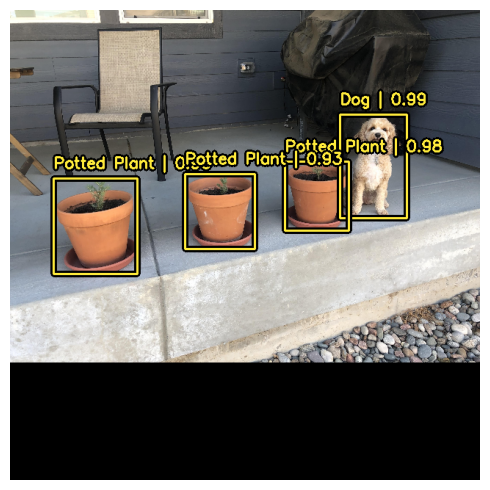

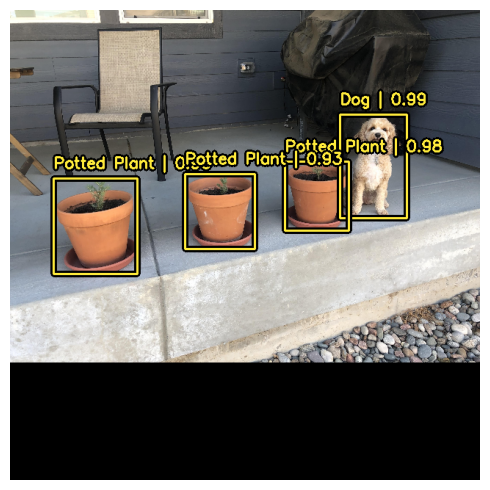

In [ ]:
y_pred = pretrained_model.predict(image_batch)
# y_pred is a bounding box Tensor:
# {"classes": ..., boxes": ...}
visualization.plot_bounding_box_gallery(
    image_batch,
    value_range=(0, 255),
    rows=1,
    cols=1,
    y_pred=y_pred,
    scale=5,
    font_scale=0.7,
    bounding_box_format="xywh",
    class_mapping=class_mapping,
)

In order to support this easy and intuitive inference workflow, KerasCV
performs non-max suppression inside of the `YOLOV8Detector` class.
Non-max suppression is a traditional computing algorithm that solves the problem
of a model detecting multiple boxes for the same object.

Non-max suppression is a highly configurable algorithm, and in most cases you
will want to customize the settings of your model's non-max
suppression operation.
This can be done by overriding to the `prediction_decoder` argument.

To show this concept off, let's temporarily disable non-max suppression on our
YOLOV8Detector.  This can be done by writing to the `prediction_decoder` attribute.

---
Чтобы поддержать этот простой и интуитивно понятный рабочий процесс вывода, KerasCV
выполняет немаксимальное подавление внутри класса `YOLOV8Detector`.
Немаксимальное подавление — это традиционный вычислительный алгоритм, решающий проблему.
модели, обнаруживающей несколько ящиков для одного и того же объекта.

Немаксимальное подавление — это легко настраиваемый алгоритм, и в большинстве случаев вы
захочу настроить параметры немаксимальной модели вашей модели
Операция по подавлению.
Это можно сделать путем переопределения аргумента `prediction_decoder`.

Чтобы продемонстрировать эту концепцию, давайте временно отключим немаксимальное подавление на нашем
YOLOV8Детектор. Это можно сделать, записав в атрибут `prediction_decoder`.

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


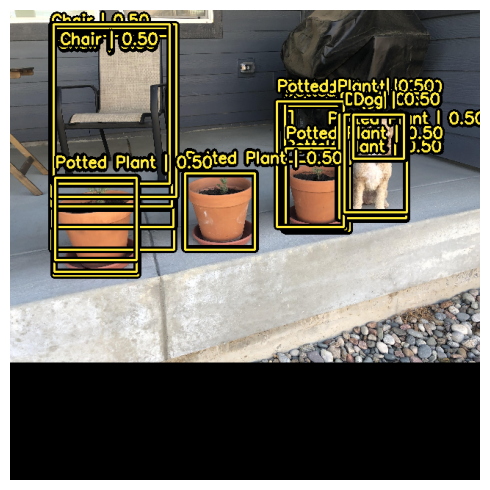

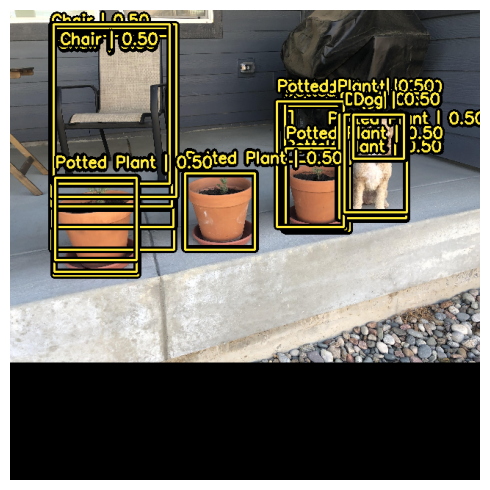

In [ ]:
# The following NonMaxSuppression layer is equivalent to disabling the operation
prediction_decoder = keras_cv.layers.NonMaxSuppression(
    bounding_box_format="xywh",
    from_logits=True,
    iou_threshold=1.0,
    confidence_threshold=0.0,
)
pretrained_model = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc",
    bounding_box_format="xywh",
    prediction_decoder=prediction_decoder,
)

y_pred = pretrained_model.predict(image_batch)
visualization.plot_bounding_box_gallery(
    image_batch,
    value_range=(0, 255),
    rows=1,
    cols=1,
    y_pred=y_pred,
    scale=5,
    font_scale=0.7,
    bounding_box_format="xywh",
    class_mapping=class_mapping,
)


Next, let's re-configure `keras_cv.layers.NonMaxSuppression` for our
use case!
In this case, we will tune the `iou_threshold` to `0.2`, and the
`confidence_threshold` to `0.7`.

Raising the `confidence_threshold` will cause the model to only output boxes
that have a higher confidence score. `iou_threshold` controls the threshold of
intersection over union (IoU) that two boxes must have in order for one to be
pruned out.
[More information on these parameters may be found in the TensorFlow API docs](https://www.tensorflow.org/api_docs/python/tf/image/combined_non_max_suppression)

---
Далее давайте перенастроим `keras_cv.layers.NonMaxSuppression` для нашего
вариант использования!
В этом случае мы настроим `iou_threshold` на `0,2`, а
`confidence_threshold` на `0,7`.

Повышение `confidence_threshold` приведет к тому, что модель будет выводить только поля.
которые имеют более высокий показатель достоверности. `iou_threshold` контролирует порог
пересечение через объединение (IoU), которое должно быть у двух ящиков, чтобы один был обрезано.
[More information on these parameters may be found in the TensorFlow API docs](https://www.tensorflow.org/api_docs/python/tf/image/combined_non_max_suppression)

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


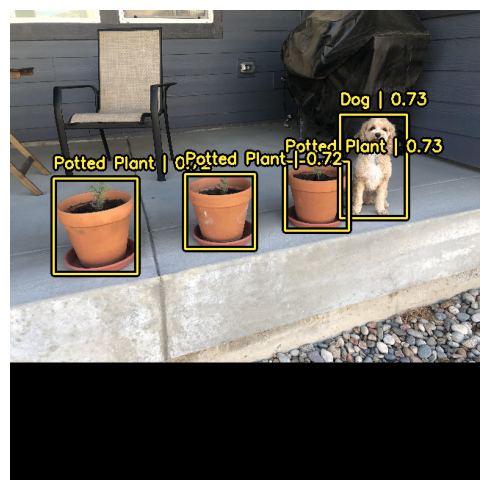

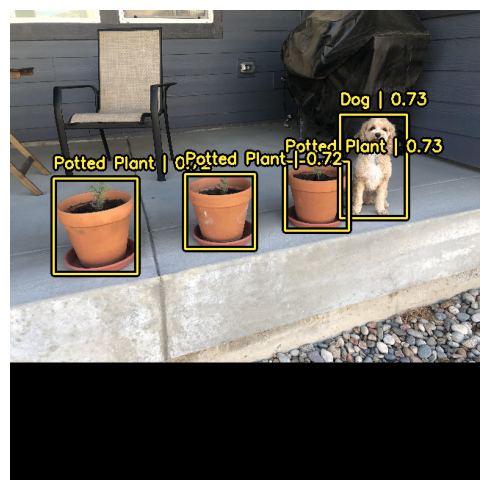

In [ ]:
prediction_decoder = keras_cv.layers.NonMaxSuppression(
    bounding_box_format="xywh",
    from_logits=True,
    # Decrease the required threshold to make predictions get pruned out
    iou_threshold=0.2,
    # Tune confidence threshold for predictions to pass NMS
    confidence_threshold=0.7,
)
pretrained_model = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc",
    bounding_box_format="xywh",
    prediction_decoder=prediction_decoder,
)

y_pred = pretrained_model.predict(image_batch)
visualization.plot_bounding_box_gallery(
    image_batch,
    value_range=(0, 255),
    rows=1,
    cols=1,
    y_pred=y_pred,
    scale=5,
    font_scale=0.7,
    bounding_box_format="xywh",
    class_mapping=class_mapping,
)

That looks a lot better!

## Train a custom object detection model

![](https://storage.googleapis.com/keras-nlp/getting_started_guide/prof_keras_advanced.png)

Whether you're an object detection amateur or a well seasoned veteran, assembling
an object detection pipeline from scratch is a massive undertaking.
Luckily, all KerasCV object detection APIs are built as modular components.
Whether you need a complete pipeline, just an object detection model, or even
just a conversion utility to transform your boxes from `xywh` format to `xyxy`,
KerasCV has you covered.

In this guide, we'll assemble a full training pipeline for a KerasCV object
detection model.  This includes data loading, augmentation, metric evaluation,
and inference!

To get started, let's sort out all of our imports and define global
configuration parameters.

---
Это выглядит намного лучше!

## Обучение пользовательской модели обнаружения объектов

![](https://storage.googleapis.com/keras-nlp/getting_started_guide/prof_keras_advanced.png)

Являетесь ли вы любителем обнаружения объектов или опытным ветераном, сборка
Создание конвейера обнаружения объектов с нуля — это масштабная задача.
К счастью, все API обнаружения объектов KerasCV построены как модульные компоненты.
Нужен ли вам полный конвейер, просто модель обнаружения объектов или даже
просто утилита преобразования для преобразования ваших коробок из формата «xywh» в «xyxy»,
KerasCV поможет вам.

В этом руководстве мы соберем полный конвейер обучения для объекта KerasCV.
модель обнаружения. Сюда входит загрузка данных, увеличение, оценка показателей,
и вывод!

Для начала давайте разберемся со всем нашим импортом и определим глобальные
параметры конфигурации.

In [ ]:
BATCH_SIZE = 4

## Data loading

To get started, let's discuss data loading and bounding box formatting.
KerasCV has a predefined format for bounding boxes.
To comply with this, you
should package your bounding boxes into a dictionary matching the
specification below:

```
bounding_boxes = {
    # num_boxes may be a Ragged dimension
    'boxes': Tensor(shape=[batch, num_boxes, 4]),
    'classes': Tensor(shape=[batch, num_boxes])
}
```

`bounding_boxes['boxes']` contains the coordinates of your bounding box in a KerasCV
supported `bounding_box_format`.
KerasCV requires a `bounding_box_format` argument in all components that process
bounding boxes.
This is done to maximize your ability to plug and play individual components
into their object detection pipelines, as well as to make code self-documenting
across object detection pipelines.

To match the KerasCV API style, it is recommended that when writing a
custom data loader, you also support a `bounding_box_format` argument.
This makes it clear to those invoking your data loader what format the bounding boxes
are in.
In this example, we format our boxes to `xywh` format.

For example:

```python
train_ds, ds_info = your_data_loader.load(
    split='train', bounding_box_format='xywh', batch_size=8
)
```

This clearly yields bounding boxes in the format `xywh`.  You can read more about
KerasCV bounding box formats [in the API docs](https://keras.io/api/keras_cv/bounding_box/formats/).

Our data comes loaded into the format
`{"images": images, "bounding_boxes": bounding_boxes}`.  This format is
supported in all KerasCV preprocessing components.

Let's load some data and verify that the data looks as we expect it to.

---
## Загрузка данных

Для начала давайте обсудим загрузку данных и форматирование ограничивающей рамки.
KerasCV имеет предопределенный формат ограничивающих рамок.
Чтобы соответствовать этому, вы
следует упаковать ограничивающие рамки в словарь, соответствующий
спецификация ниже:

```
bounding_boxes = {
    # num_boxes может быть измерением Ragged
    'boxes': Tensor(shape=[batch, num_boxes, 4]),
    'classes': Tensor(shape=[batch, num_boxes])
}
```

`bounding_boxes['boxes']` содержит координаты вашей ограничивающей рамки в KerasCV.
поддерживается `bounding_box_format`.
KerasCV требует аргументаbounding_box_format во всех компонентах, которые обрабатывают
ограничивающие рамки.
Это сделано для того, чтобы максимизировать ваши возможности по подключению и работе отдельных компонентов.
в свои конвейеры обнаружения объектов, а также сделать код самодокументируемым.
по конвейерам обнаружения объектов.

Чтобы соответствовать стилю API KerasCV, рекомендуется при написании
пользовательский загрузчик данных, вы также поддерживаете аргумент `bounding_box_format`.
Это дает понять тем, кто вызывает ваш загрузчик данных, какой формат ограничивающих рамок.
находятся в.
В этом примере мы форматируем наши поля в формат xywh.

Например:

```python
train_ds, ds_info = your_data_loader.load(
    Split='train',bounding_box_format='xywh',atch_size=8
)
```

Это явно дает ограничивающие рамки в формате `xywh`. Вы можете прочитать больше о
Форматы ограничивающей рамки KerasCV [in the API docs](https://keras.io/api/keras_cv/bounding_box/formats/).

Наши данные загружаются в формате
`{"images": images, "bounding_boxes": bounding_boxes}`. Этот формат
поддерживается во всех компонентах предварительной обработки KerasCV.

Давайте загрузим некоторые данные и проверим, что они выглядят так, как мы ожидаем.

In [ ]:

def visualize_dataset(inputs, value_range, rows, cols, bounding_box_format):
    inputs = next(iter(inputs.take(1)))
    images, bounding_boxes = inputs["images"], inputs["bounding_boxes"]
    visualization.plot_bounding_box_gallery(
        images,
        value_range=value_range,
        rows=rows,
        cols=cols,
        y_true=bounding_boxes,
        scale=5,
        font_scale=0.7,
        bounding_box_format=bounding_box_format,
        class_mapping=class_mapping,
    )


def unpackage_raw_tfds_inputs(inputs, bounding_box_format):
    image = inputs["image"]
    boxes = keras_cv.bounding_box.convert_format(
        inputs["objects"]["bbox"],
        images=image,
        source="rel_yxyx",
        target=bounding_box_format,
    )
    bounding_boxes = {
        "classes": inputs["objects"]["label"],
        "boxes": boxes,
    }
    return {"images": image, "bounding_boxes": bounding_boxes}


def load_pascal_voc(split, dataset, bounding_box_format):
    ds = tfds.load(dataset, split=split, with_info=False, shuffle_files=True)
    ds = ds.map(
        lambda x: unpackage_raw_tfds_inputs(x, bounding_box_format=bounding_box_format),
        num_parallel_calls=tf_data.AUTOTUNE,
    )
    return ds


train_ds = load_pascal_voc(
    split="train", dataset="voc/2007", bounding_box_format="xywh"
)
eval_ds = load_pascal_voc(split="test", dataset="voc/2007", bounding_box_format="xywh")

train_ds = train_ds.shuffle(BATCH_SIZE * 4)

Next, let's batch our data.

In KerasCV object detection tasks it is recommended that
users use ragged batches of inputs.
This is due to the fact that images may be of different sizes in PascalVOC,
as well as the fact that there may be different numbers of bounding boxes per
image.

To construct a ragged dataset in a `tf.data` pipeline, you can use the
`ragged_batch()` method.

---
Далее давайте группируем наши данные.

В задачах обнаружения объектов KerasCV рекомендуется
пользователи используют разрозненные пакеты входных данных.
Это связано с тем, что в PascalVOC изображения могут быть разного размера,
а также тот факт, что может быть разное количество ограничивающих рамок на
изображение.

Чтобы создать неоднородный набор данных в конвейере `tf.data`, вы можете использовать команду
метод `ragged_batch()`.

In [ ]:
train_ds = train_ds.ragged_batch(BATCH_SIZE, drop_remainder=True)
eval_ds = eval_ds.ragged_batch(BATCH_SIZE, drop_remainder=True)

Let's make sure our dataset is following the format KerasCV expects.
By using the `visualize_dataset()` function, you can visually verify
that your data is in the format that KerasCV expects.  If the bounding boxes
are not visible or are visible in the wrong locations that is a sign that your
data is mis-formatted.

---
Давайте убедимся, что наш набор данных соответствует формату, который ожидает KerasCV.
Используя функцию `visualize_dataset()`, вы можете визуально проверить
что ваши данные находятся в формате, ожидаемом KerasCV. Если ограничивающие рамки
не видны или видны не в тех местах, что является признаком того, что ваш
данные имеют неверный формат.

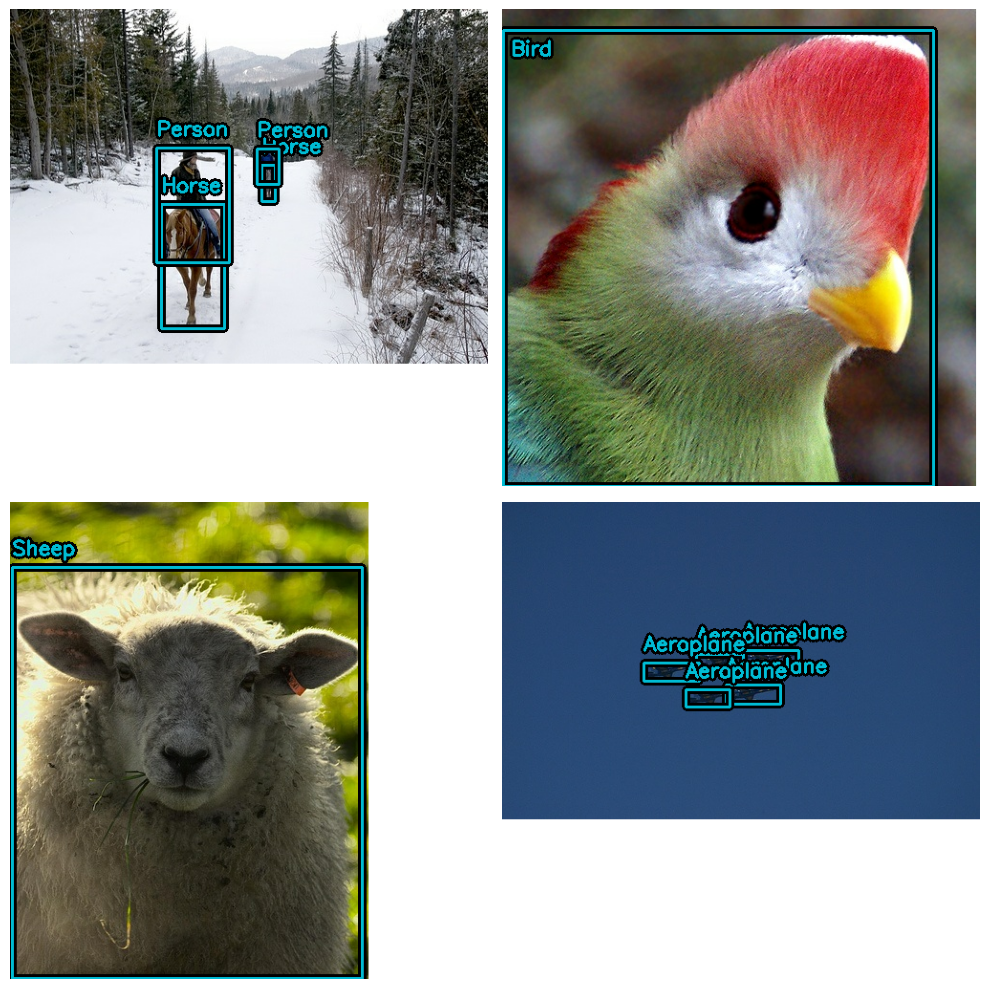

In [ ]:
visualize_dataset(
    train_ds, bounding_box_format="xywh", value_range=(0, 255), rows=2, cols=2
)

And for the eval set:

---
И для оценочного набора

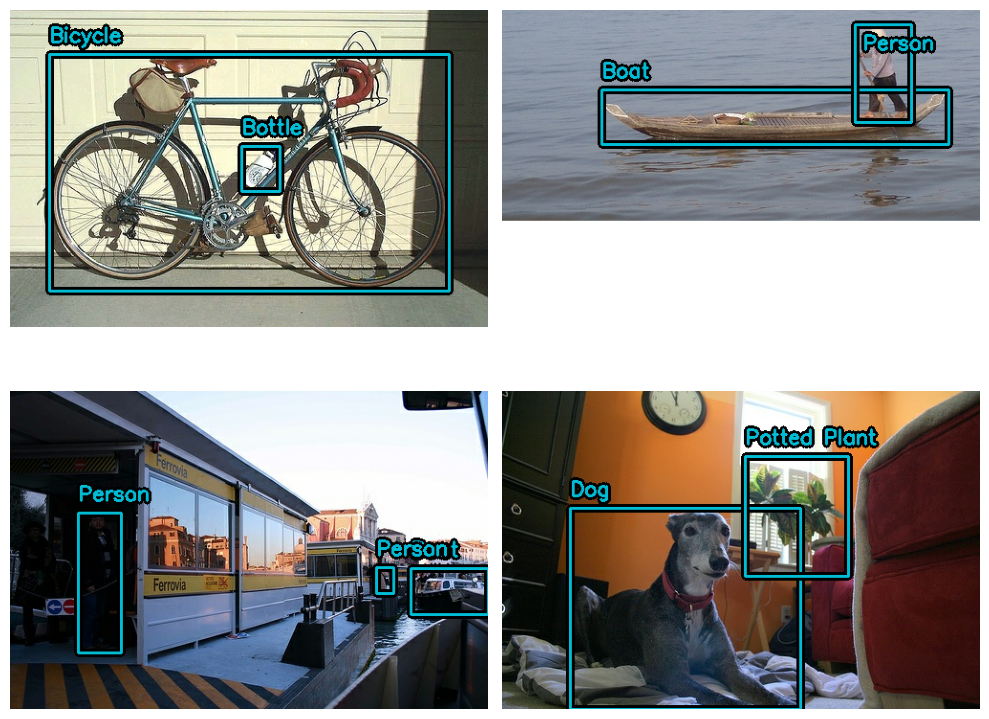

In [ ]:
visualize_dataset(
    eval_ds,
    bounding_box_format="xywh",
    value_range=(0, 255),
    rows=2,
    cols=2,
    # If you are not running your experiment on a local machine, you can also
    # make `visualize_dataset()` dump the plot to a file using `path`:
    # path="eval.png"
)

Looks like everything is structured as expected.
Now we can move on to constructing our
data augmentation pipeline.

## Data augmentation

One of the most challenging tasks when constructing object detection
pipelines is data augmentation.  Image augmentation techniques must be aware of the underlying
bounding boxes, and must update them accordingly.

Luckily, KerasCV natively supports bounding box augmentation with its extensive
library
of [data augmentation layers](https://keras.io/api/keras_cv/layers/preprocessing/).
The code below loads the Pascal VOC dataset, and performs on-the-fly,
bounding-box-friendly data augmentation inside a `tf.data` pipeline.



---
Похоже, все структурировано так, как и ожидалось.
Теперь мы можем перейти к построению нашего
конвейер увеличения данны
х.
## Увеличение данных
Одной из наиболее сложных задач при построении конвейеров обнаружения объектов является увеличение данных. Методы увеличения изображения должны учитывать основные ограничивающие рамки и соответствующим образом обновлять их.

К счастью, KerasCV изначально поддерживает расширение ограничивающей рамки с помощью своей обширной библиотеки слоев расширения данных. Приведенный ниже код загружает набор данных Pascal VOC и выполняет оперативное увеличение данных с возможностью ограничивающего прямоугольника внутри конвейера `tf.data`.

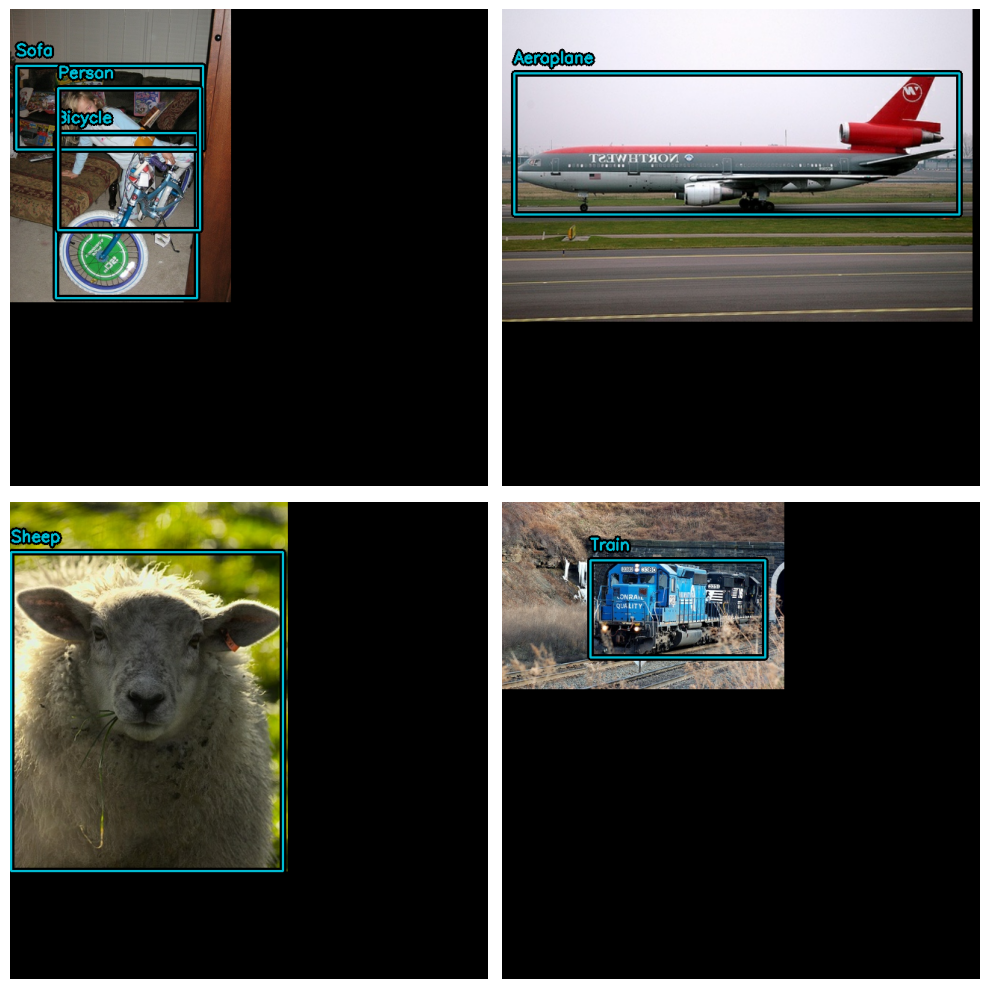

In [ ]:
augmenters = [
    keras_cv.layers.RandomFlip(mode="horizontal", bounding_box_format="xywh"),
    keras_cv.layers.JitteredResize(
        target_size=(640, 640), scale_factor=(0.75, 1.3), bounding_box_format="xywh"
    ),
]


def create_augmenter_fn(augmenters):
    def augmenter_fn(inputs):
        for augmenter in augmenters:
            inputs = augmenter(inputs)
        return inputs

    return augmenter_fn


augmenter_fn = create_augmenter_fn(augmenters)

train_ds = train_ds.map(augmenter_fn, num_parallel_calls=tf_data.AUTOTUNE)
visualize_dataset(
    train_ds, bounding_box_format="xywh", value_range=(0, 255), rows=2, cols=2
)

Great! We now have a bounding-box-friendly data augmentation pipeline.
Let's format our evaluation dataset to match.  Instead of using
`JitteredResize`, let's use the deterministic `keras_cv.layers.Resizing()`
layer.

---
Отлично! Теперь у нас есть конвейер пополнения данных, удобный для использования с ограничивающей рамкой.
Давайте отформатируем наш набор оценочных данных так, чтобы он соответствовал. Вместо использования
`JitteredResize`, давайте использовать детерминированный `keras_cv.layers.Resizing()`
слой.

In [ ]:
inference_resizing = keras_cv.layers.Resizing(
    640, 640, bounding_box_format="xywh", pad_to_aspect_ratio=True
)
eval_ds = eval_ds.map(inference_resizing, num_parallel_calls=tf_data.AUTOTUNE)

Due to the fact that the resize operation differs between the train dataset,
which uses `JitteredResize()` to resize images, and the inference dataset, which
uses `layers.Resizing(pad_to_aspect_ratio=True)`, it is good practice to
visualize both datasets:

---
В связи с тем, что операция изменения размера различается в зависимости от набора данных поезда,
который использует` JitteredResize(`) для изменения размера изображений, и набор данных вывода, который
использует `layers.Resizing(pad_to_aspect_ratio=True)`, рекомендуется
визуализируйте оба набора данных:

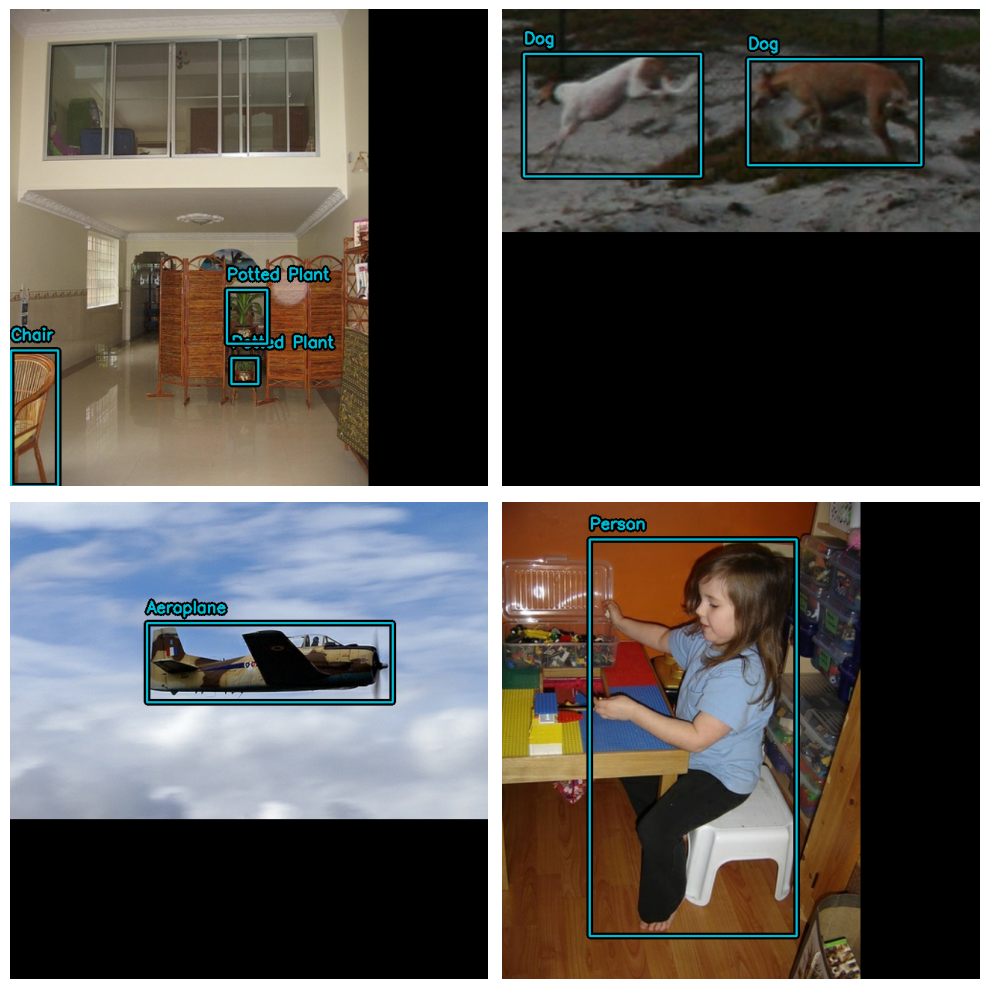

In [ ]:
visualize_dataset(
    eval_ds, bounding_box_format="xywh", value_range=(0, 255), rows=2, cols=2
)

Finally, let's unpackage our inputs from the preprocessing dictionary, and
prepare to feed the inputs into our model.  In order to be TPU compatible,
bounding box Tensors need to be `Dense` instead of `Ragged`.

---
Наконец, давайте не распаковынем наши входные данные из словаря предварительной обработки, и
Подготовьтесь к подаче входов в нашу модель. Чтобы быть совместимым с TPU,
Тензоры ограничивающей коробки должны быть «плотными» вместо «рваного».

In [ ]:

def dict_to_tuple(inputs):
    return inputs["images"], bounding_box.to_dense(
        inputs["bounding_boxes"], max_boxes=32
    )


train_ds = train_ds.map(dict_to_tuple, num_parallel_calls=tf_data.AUTOTUNE)
eval_ds = eval_ds.map(dict_to_tuple, num_parallel_calls=tf_data.AUTOTUNE)

train_ds = train_ds.prefetch(tf_data.AUTOTUNE)
eval_ds = eval_ds.prefetch(tf_data.AUTOTUNE)

### Optimizer

In this guide, we use a standard SGD optimizer and rely on the
[`keras.callbacks.ReduceLROnPlateau`](https://keras.io/api/callbacks/reduce_lr_on_plateau/)
callback to reduce the learning rate.

You will always want to include a `global_clipnorm` when training object
detection models.  This is to remedy exploding gradient problems that frequently
occur when training object detection

---
### Оптимизатор

В этом руководстве мы используем стандартный оптимизатор SGD и полагаемся на
[`keras.callbacks.ReduceLROnPlateau`](https://keras.io/api/callbacks/reduce_lr_on_plateau/)
обратный вызов для снижения скорости обучения.

Вы всегда захотите вкл`ючить global_cl`ipnorm при обучении объекта.
модели обнаружения. Это сделано для устранения проблем с взрывным градиентом, которые часто
возникают при обучении моделей обнаружения объектов. models.

In [ ]:
base_lr = 0.005
# including a global_clipnorm is extremely important in object detection tasks
optimizer = keras.optimizers.SGD(
    learning_rate=base_lr, momentum=0.9, global_clipnorm=10.0
)

To achieve the best results on your dataset, you'll likely want to hand craft a
`PiecewiseConstantDecay` learning rate schedule.
While `PiecewiseConstantDecay` schedules tend to perform better, they don't
translate between proble

---
Чтобы добиться наилучших результатов в вашем наборе данных, вам, вероятно, захочется вручную создать
График скорости обучения` PiecewiseConstantDeca`y.
Хотя расписани`я PiecewiseConstantDec`ay, как правило, работают лучше, они не
переводить между задачами.ms.

### Loss functions

You may not be familiar with the `"ciou"` loss.  While not common in other
models, this loss is sometimes used in the object detection world.

In short, ["Complete IoU"](https://arxiv.org/abs/1911.08287) is a flavour of the Intersection over Union loss and is used due to its convergence properties.

In KerasCV, you can use this loss simply by passing the string `"ciou"` to `compile()`.
We also use standard binary crossentropy loss for the cla

---
### Функции потерь

Возможно, вы не знакомы с потерей «ciou». Хотя это не распространено в других
моделях эта потеря иногда используется в мире обнаружения объектов.

Короче говоря, ["Complete IoU"](https://arxiv.org/abs/1911.08287) представляет собой вариант пересечения с потерей объединения и используется из-за его свойств сходимости.

В KerasCV вы можете использовать эту потерю, просто передав строку `"ciou"` в `compile()`.
Мы также используем стандартную двоичную кроссэнтропийную потерю для главы класса.ss head.

In [ ]:
pretrained_model.compile(
    classification_loss="binary_crossentropy",
    box_loss="ciou",
)

### Metric evaluation

The most popular object detection metrics are COCO metrics,
which were published alongside the MSCOCO dataset. KerasCV provides an
easy-to-use suite of COCO metrics under the `keras_cv.callbacks.PyCOCOCallback`
symbol. Note that we use a Keras callback instead of a Keras metric to compute
COCO metrics. This is because computing COCO metrics requires storing all of a
model's predictions for the entire evaluation dataset in memory at once, which
is impractical to do during training time.

---
### Оценка показателей

Наиболее популярными метриками обнаружения объектов являются метрики COCO,
которые были опубликованы вместе с набором данных MSCOCO. KerasCV предоставляет
простой в использовании набор метрик COCO под именем `keras_cv.callbacks.PyCOCOCallback`.
символ. Обратите внимание, что для вычисления мы используем обратный вызов Keras вместо метрики Keras.
КОКО-метрики. Это связано с тем, что для расчета метрик COCO требуется хранить всю
прогнозы модели для всего набора оценочных данных в памяти одновременно, что
во время тренировки это делать нецелесообразно.

In [ ]:
coco_metrics_callback = keras_cv.callbacks.PyCOCOCallback(
    eval_ds.take(20), bounding_box_format="xywh"
)

Our data pipeline is now complete!
We can now move on to model creation and training.

## Model creation

Next, let's use the KerasCV API to construct an untrained YOLOV8Detector model.
In this tutorial we use a pretrained ResNet50 backbone from the imagenet
dataset.

KerasCV makes it easy to construct a `YOLOV8Detector` with any of the KerasCV
backbones.  Simply use one of the presets for the architecture you'd like!

For example:

---
Наш конвейер данных готов!
Теперь мы можем перейти к созданию и обучению модели.

## Создание модели

Далее давайте воспользуемся API KerasCV для создания необученной модели YOLOV8Detector.
В этом уроке мы используем предварительно обученную магистраль ResNet50 из imagenet.
набор данных.

KerasCV позволяет легко создать `YOLOV8Detector` с помощью любого из KerasCV.
позвоночника. Просто используйте один из пресетов для желаемой архитектуры!

Например:

In [ ]:
model = keras_cv.models.YOLOV8Detector.from_preset(
    "resnet50_imagenet",
    # For more info on supported bounding box formats, visit
    # https://keras.io/api/keras_cv/bounding_box/
    bounding_box_format="xywh",
    num_classes=20,
)

That is all it takes to construct a KerasCV YOLOv8. The YOLOv8 accepts
tuples of dense image Tensors and bounding box dictionaries to `fit()` and
`train_on_batch()`

This matches what we have constructed in our input pipeline ab

---
Это все, что нужно для создания KerasCV YOLOv8. YOLOv8 принимает
кортежи плотных изображений. Тензоры и словари ограничивающих рамок для `fit()` и
`train_on_batch()`

Это соответствует тому, что мы построили в нашем входном конвейере выше.ove.

## Training our model

All that is left to do is train our model.  KerasCV object detection models
follow the standard Keras workflow, leveraging `compile()` and `fit()`.

Let's compile our m

---
## Обучение нашей модели

Осталось только обучить нашу модель. Модели обнаружения объектов KerasCV
следуйте стандартному рабочему процессу Keras, используя `compile()` и `fit()`.

Скомпилируем нашу модель:odel:odel:

In [ ]:
model.compile(
    classification_loss="binary_crossentropy",
    box_loss="ciou",
    optimizer=optimizer,
)

If you want to fully train the model, remove .take(20) from all dataset references (below and in the initialization of the metrics callback).

---
Если вы хотите полностью обучить модель, удалите .take(20) из всех ссылок на наборы данных (ниже и при инициализации обратного вызова метрик).

In [ ]:
model.fit(
    train_ds.take(20),
    # Run for 10-35~ epochs to achieve good scores.
    epochs=10,
    callbacks=[coco_metrics_callback],
)

Epoch 1/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 55s 3s/step
creating index...
index created!
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.16s).
Accumulating evaluation results...
DONE (t=0.08s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.001
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.001
 Average Recall     (AR) @[ IoU=0

## Inference and plotting results

KerasCV makes object detection inference simple.  `model.predict(images)`
returns a tensor of bounding boxes.  By default, `YOLOV8Detector.predict()`
will perform a non max suppression operation for you.

In this section, we will use a `keras_cv` provided p

---
## Вывод и построение результатов

KerasCV упрощает процесс обнаружения объектов. `model.predict(изображения)`
возвращает тензор ограничивающих рамок. По умолчанию `YOLOV8Detector.predict()`
выполнит для вас операцию не максимального подавления.

В этом разделе мы будем использовать пресет, предоставленный keras_cv:reset:

In [ ]:
model = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc", bounding_box_format="xywh"
)

Next, for convenience we construct a dataset with larger batches:

---
Далее для удобства строим набор данных с более крупными пакетами:

In [ ]:
visualization_ds = eval_ds.unbatch()
visualization_ds = visualization_ds.ragged_batch(16)
visualization_ds = visualization_ds.shuffle(8)

Let's create a simple function to plot our inferences:

---

Давайте создадим простую функцию для построения наших выводов:

In [ ]:
def visualize_detections(model, dataset, bounding_box_format):
    images, y_true = next(iter(dataset.take(1)))
    y_pred = model.predict(images)
    visualization.plot_bounding_box_gallery(
        images,
        value_range=(0, 255),
        bounding_box_format=bounding_box_format,
        y_true=y_true,
        y_pred=y_pred,
        scale=4,
        rows=2,
        cols=2,
        show=True,
        font_scale=0.7,
        class_mapping=class_mapping,
    )

You may need to configure your NonMaxSuppression operation to achieve visually appealing results.

---
Возможно, вам придется настроить операцию NonMaxSuppression для достижения визуально привлекательных результатов.

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step


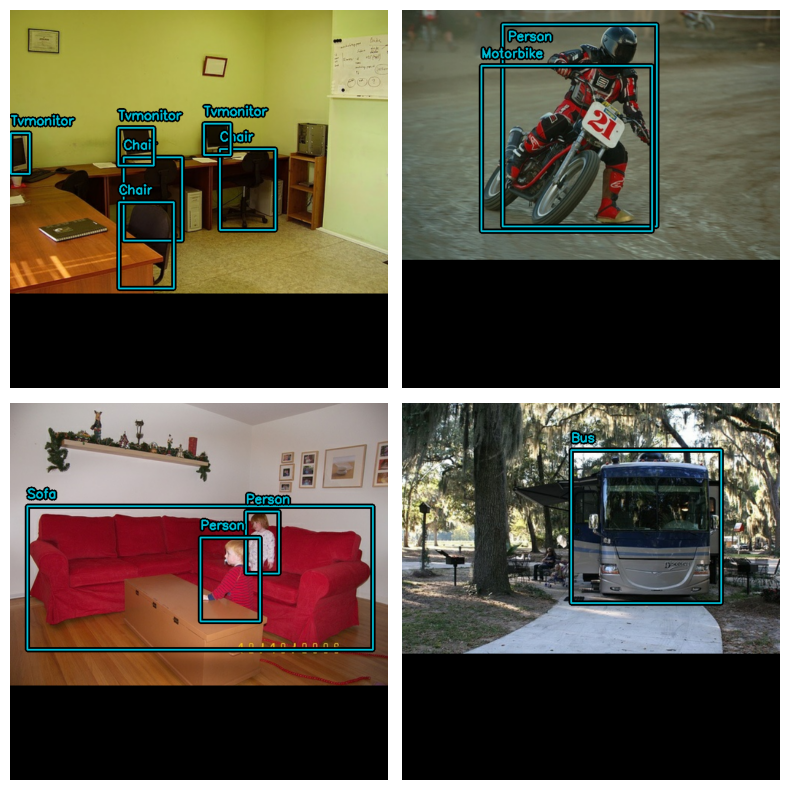

In [ ]:
model.prediction_decoder = keras_cv.layers.NonMaxSuppression(
    bounding_box_format="xywh",
    from_logits=True,
    iou_threshold=0.5,
    confidence_threshold=0.75,
)

visualize_detections(model, dataset=visualization_ds, bounding_box_format="xywh")

Awesome! One final helpful pattern to be aware of is to visualize detections in a keras.callbacks.Callback to monitor training :

---
Потрясающий! И последний полезный шаблон, о котором следует помнить, — это визуализация обнаружений в keras.callbacks.Callback для мониторинга обучения:

In [ ]:
class VisualizeDetections(keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs):
        visualize_detections(
            self.model, bounding_box_format="xywh", dataset=visualization_ds
        )

## Takeaways and next steps

KerasCV makes it easy to construct state-of-the-art object detection pipelines.
In this guide, we started off by writing a data loader using the KerasCV
bounding box specification.
Following this, we assembled a production grade data augmentation pipeline using
KerasCV preprocessing layers in <50 lines of code.

KerasCV object detection components can be used independently, but also have deep
integration with each other.
KerasCV makes authoring production grade bounding box augmentation,
model training, visualization, and
metric evaluation easy.

Some follow up exercises for the reader:

- add additional augmentation techniques to improve model performance
- tune the hyperparameters and data augmentation used to produce high quality results
- train an object detection model on your own dataset

One last fun code snippet to showcase the pow

---
## Выводы и следующие шаги

KerasCV позволяет легко создавать современные конвейеры обнаружения объектов.
В этом руководстве мы начали с написания загрузчика данных с использованием KerasCV.
спецификация ограничивающей рамки.
После этого мы собрали конвейер увеличения данных промышленного уровня, используя
Уровни предварительной обработки KerasCV в <50 строках кода.

Компоненты обнаружения объектов KerasCV могут использоваться независимо, но также имеют глубокие
интеграция друг с другом.
KerasCV обеспечивает увеличение ограничивающей рамки авторского уровня,
обучение моделей, визуализация и
метрическая оценка проста.

Некоторые дополнительные упражнения для читателя:

- добавить дополнительные методы увеличения для улучшения производительности модели.
- настроить гиперпараметры и увеличение данных, используемые для получения результатов высокого качества.
- обучить модель обнаружения объектов на собственном наборе данных

Последний забавный фрагмент кода, демонстрирующий возможности API KerasCV!er of KerasCV's API!

By using this model checkpoint, you acknowledge that its usage is subject to the terms of the CreativeML Open RAIL++-M license at https://github.com/Stability-AI/stablediffusion/blob/main/LICENSE-MODEL



50/50 ━━━━━━━━━━━━━━━━━━━━ 1539s 30s/step


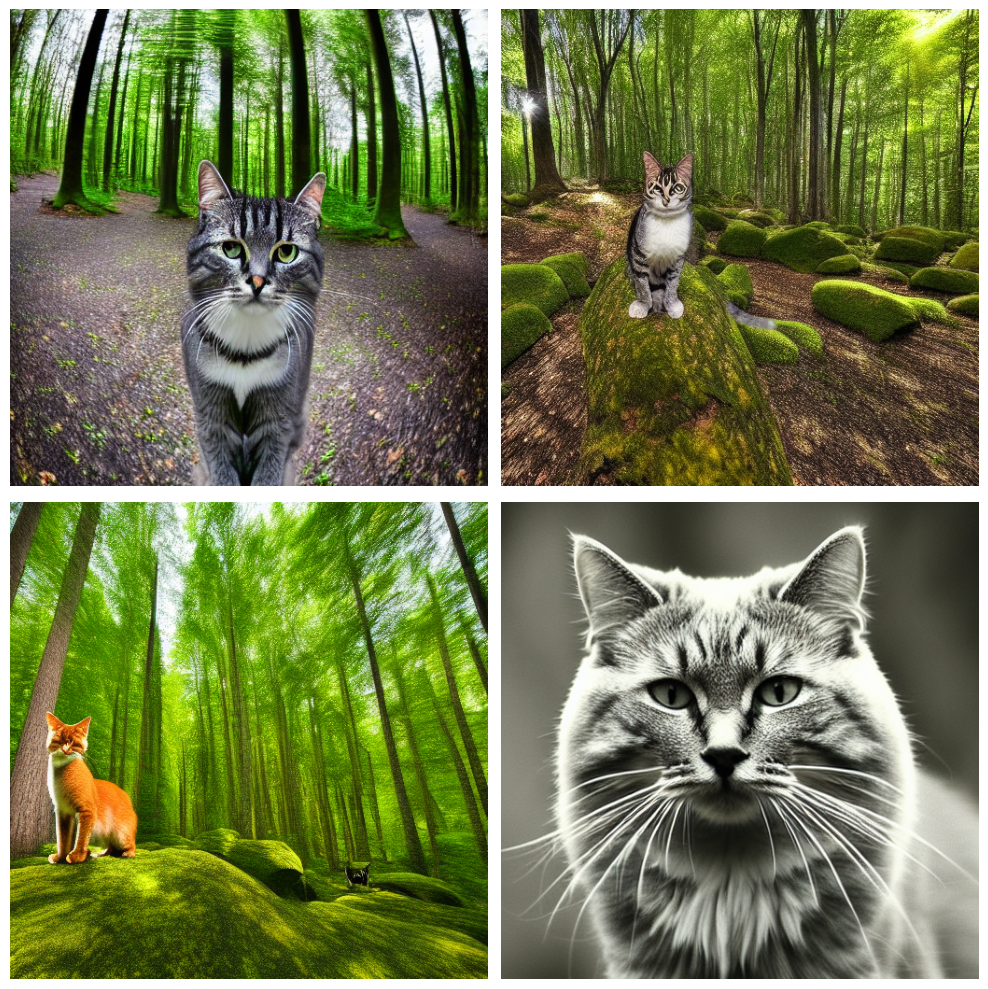

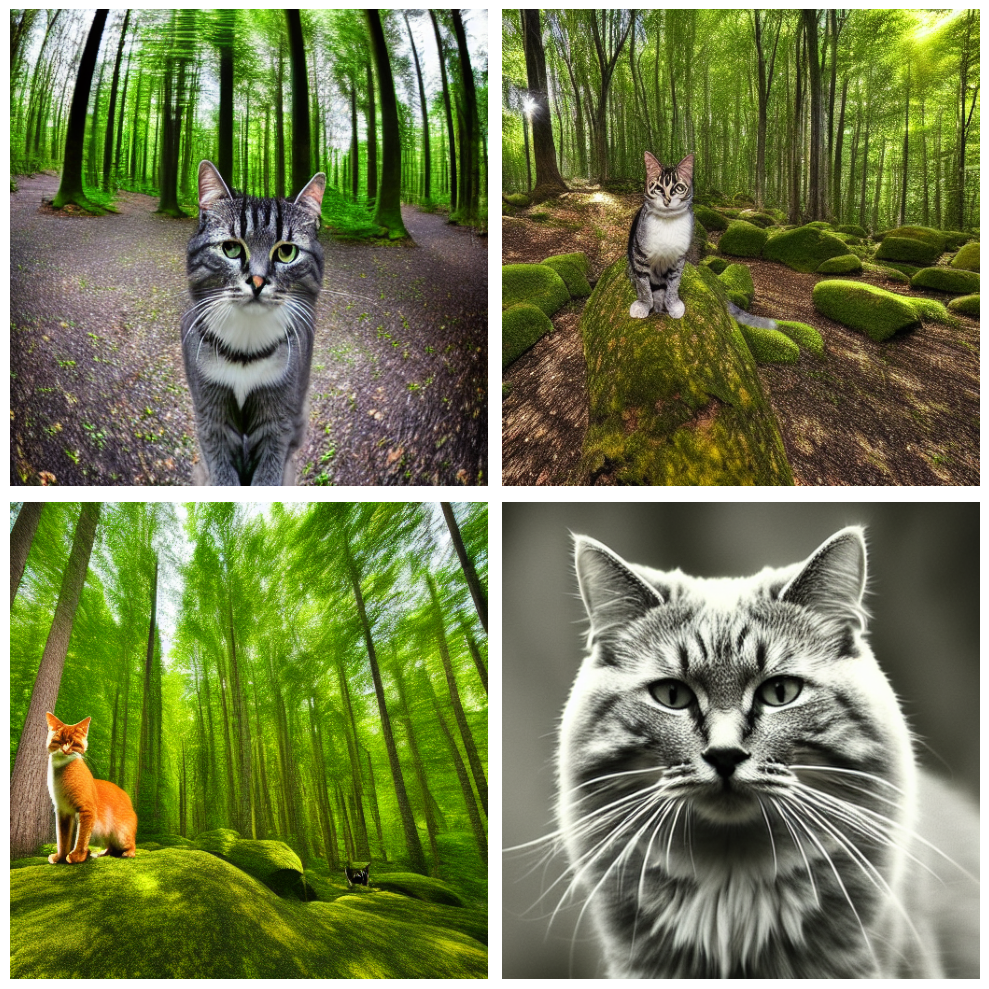

In [ ]:
stable_diffusion = keras_cv.models.StableDiffusionV2(512, 512)
images = stable_diffusion.text_to_image(
    prompt="A zoomed out photograph of a cool looking cat.  The cat stands in a beautiful forest",
    negative_prompt="unrealistic, bad looking, malformed",
    batch_size=4,
    seed=1231,
)
encoded_predictions = model(images)
y_pred = model.decode_predictions(encoded_predictions, images)
visualization.plot_bounding_box_gallery(
    images,
    value_range=(0, 255),
    y_pred=y_pred,
    rows=2,
    cols=2,
    scale=5,
    font_scale=0.7,
    bounding_box_format="xywh",
    class_mapping=class_mapping,
)

## Собствееные экперименты

### Загрузим картинку
[Python & NumPy utilities](https://keras.io/api/utils/python_utils/);  
[GitHub](https://github.com/towhee-io/towhee/blob/1269e87b860bcf3d49912a76edc4f23cc40c5aee/towhee/utils/hub_utils.py#L129)

In [ ]:
filepath = keras.utils.get_file(origin='https://glonass-gps.net/test_img/my_relatives.jpg')
image = keras.utils.load_img(filepath)
image = np.array(image)

### Визуализируем картинку
[Object Detection with KerasCV](https://keras.io/guides/keras_cv/object_detection_keras_cv/);  
[GitHub](https://github.com/keras-team/keras-cv/blob/master/keras_cv/visualization/plot_image_gallery.py#L63)

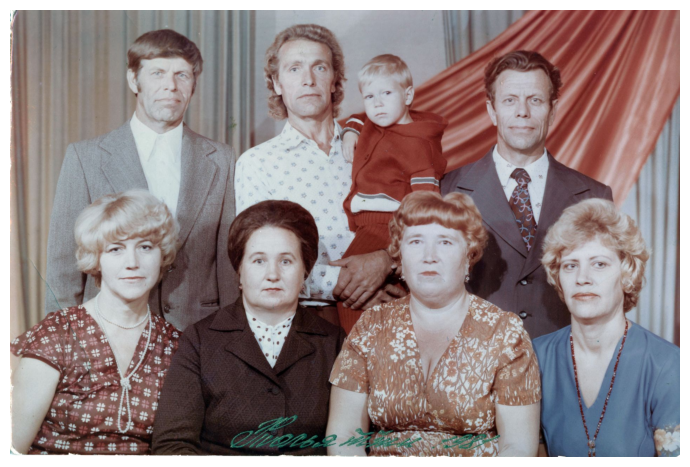

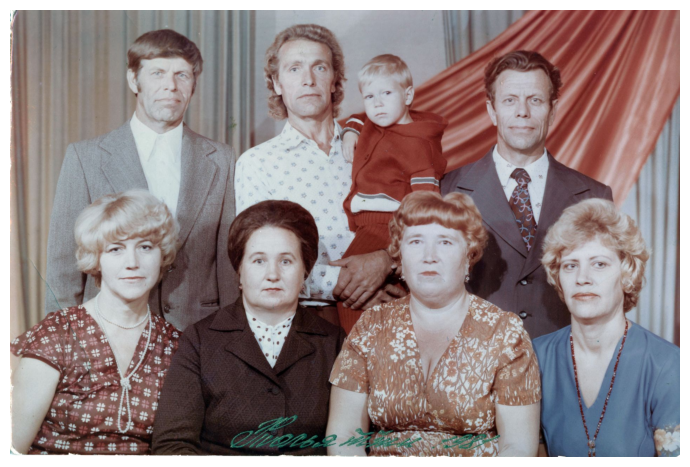

In [ ]:
visualization.plot_image_gallery(
    np.array([image]),
    value_range=(0, 255),
    rows=1,
    cols=1,
    scale=7,
)

In [ ]:
inference_resizing = keras_cv.layers.Resizing(
    640, 640, pad_to_aspect_ratio=True, bounding_box_format="xywh"
)

#Делаем размер изображения 640x640
image_batch = inference_resizing([image])

### Делаем детектирование объектов предварительно обученной НС

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


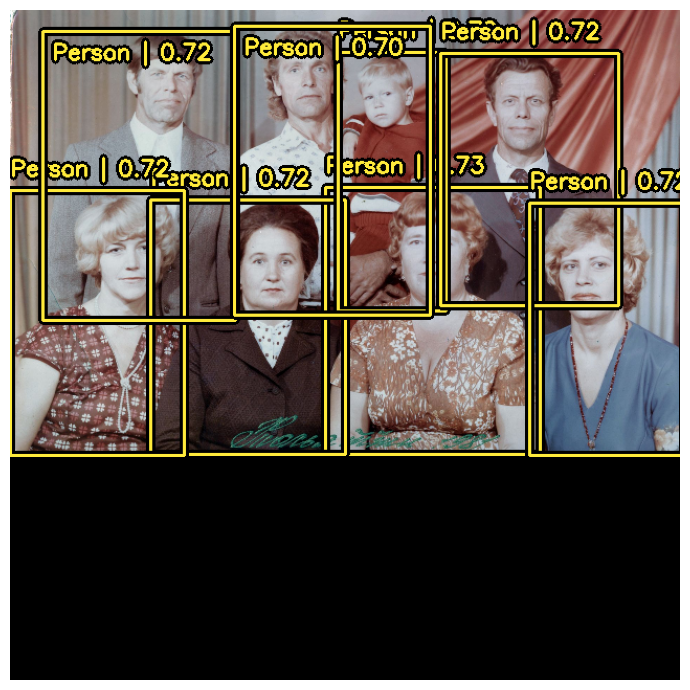

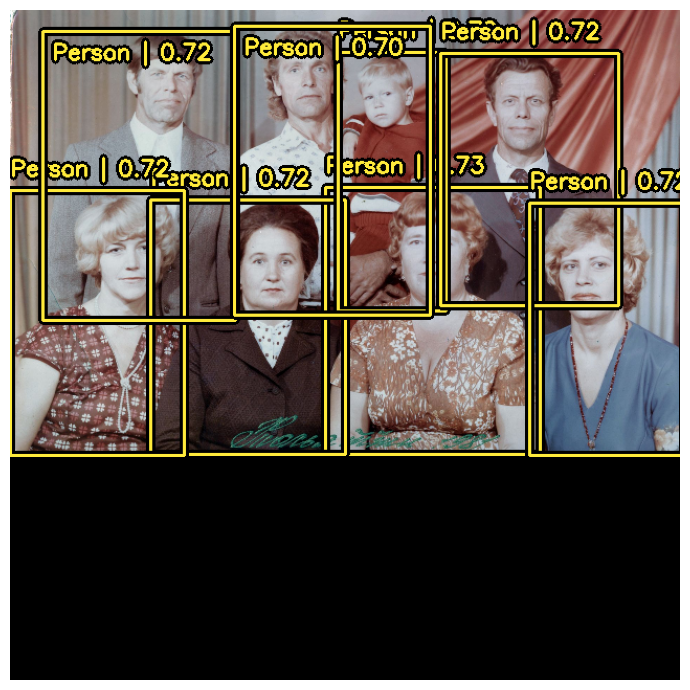

In [ ]:
# The following NonMaxSuppression layer is equivalent to disabling the operation
prediction_decoder = keras_cv.layers.NonMaxSuppression(
    bounding_box_format="xywh",
    from_logits=True,
    iou_threshold=0.4,          # Порог пересечения через объединение (iou).
    confidence_threshold=0.7,   # Порог доверия
)
pretrained_model = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc",
    bounding_box_format="xywh",
    prediction_decoder=prediction_decoder,
)

# Делаем predict
y_pred = pretrained_model.predict(image_batch)

# Отрисовываем картинку с детектированием объектов
visualization.plot_bounding_box_gallery(
    image_batch,
    value_range=(0, 255),
    rows=1,
    cols=1,
    y_pred=y_pred,
    scale=7,
    font_scale=0.7,
    bounding_box_format="xywh",
    class_mapping=class_mapping,
)

### Делаем детектирование объектов с помощью обученной НС

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


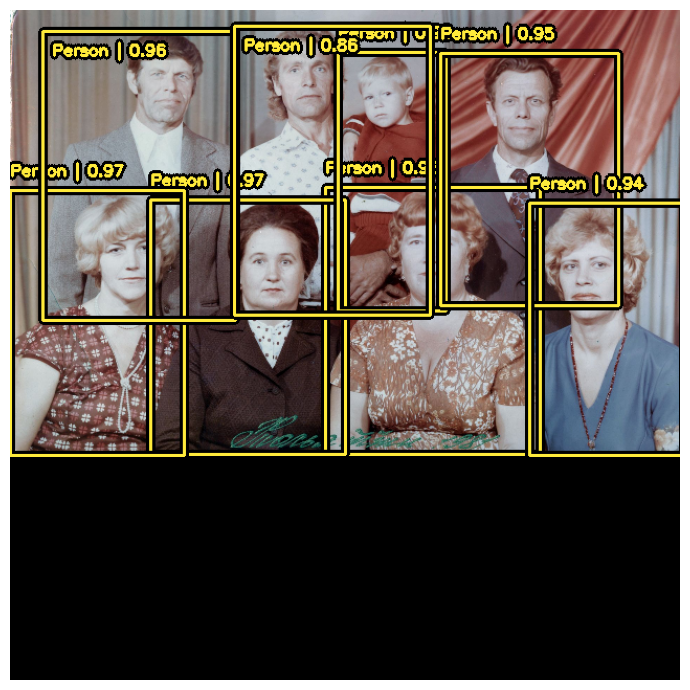

In [ ]:

model = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc",
    bounding_box_format="xywh",
)

# Делаем predict
y_pred_2 = model.predict(image_batch)

# Отрисовываем картинку с детектированием объектов
visualization.plot_bounding_box_gallery(
    image_batch,
    value_range=(0, 255),
    bounding_box_format="xywh",
    y_pred=y_pred_2,
    scale=7,
    rows=1,
    cols=1,
    show=True,
    font_scale=0.5,
    class_mapping=class_mapping,
)

## Вывод:
### Можно загрузить предварительно обученные или обучаемые модели НС KerasCV для детектирования объектов и других функций ([Модели KerasCV](https://keras.io/api/keras_cv/models/)).  

### В принципе оба этих варианта одинаково показали себя на моем примере, все персоны хорошо детектируются.  

### Если закоментировать строчку ` prediction_decoder=prediction_decoder,`

```python
pretrained_model = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc",
    bounding_box_format="xywh",
    # prediction_decoder=prediction_decoder,
)
```
### то результаты достоверности определения, в обоих случаях (предварительно обученная модель и обучаемая модель), будут одинаковы от 86% до 97%.